# Histogram Of Gradients

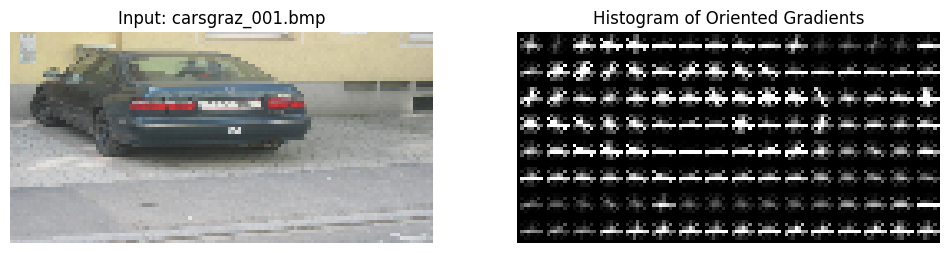

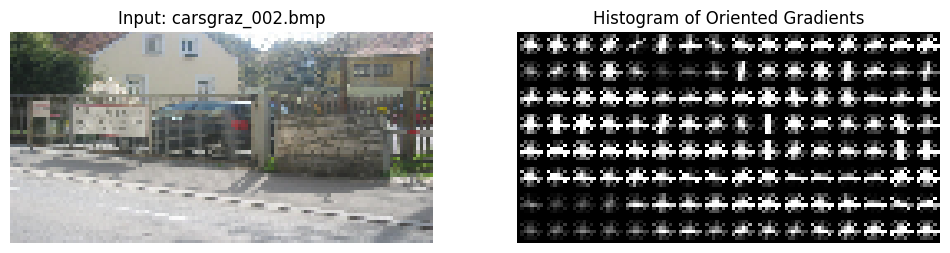

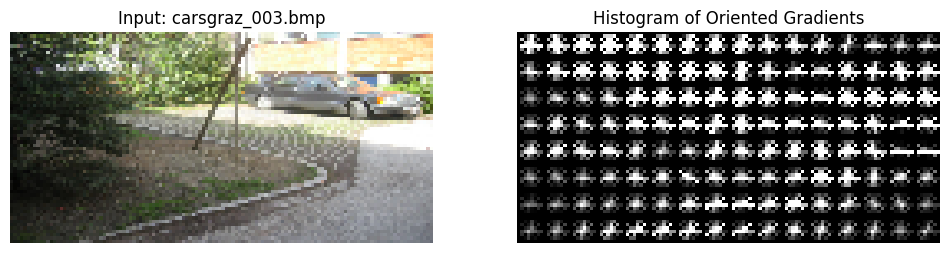

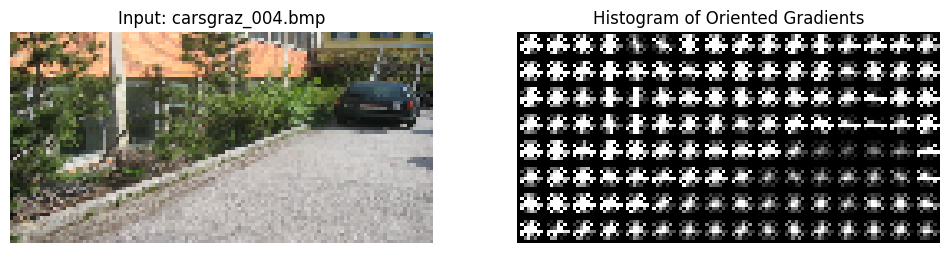

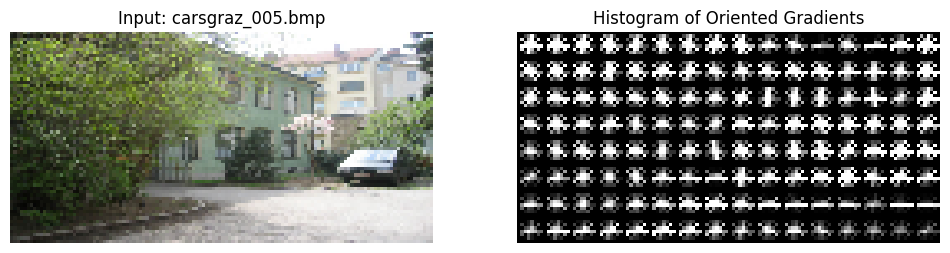

...

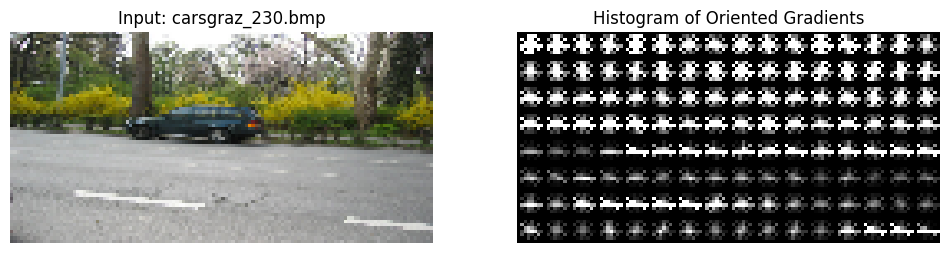

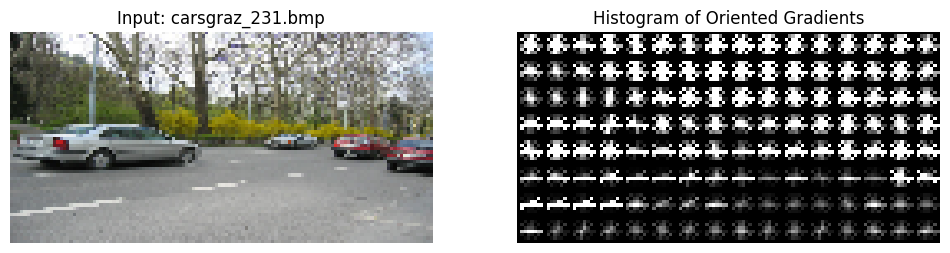

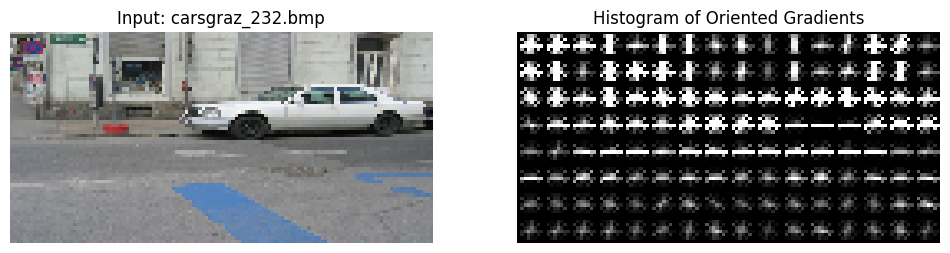

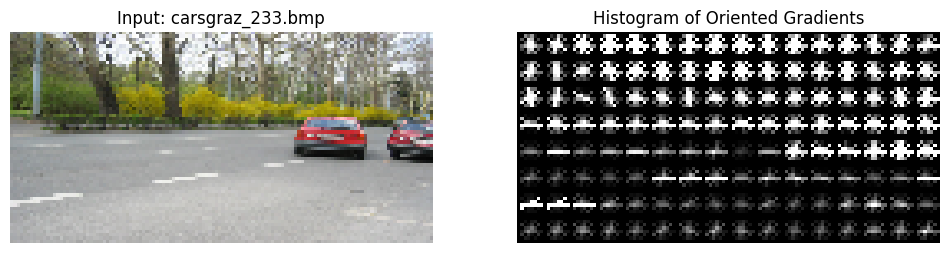

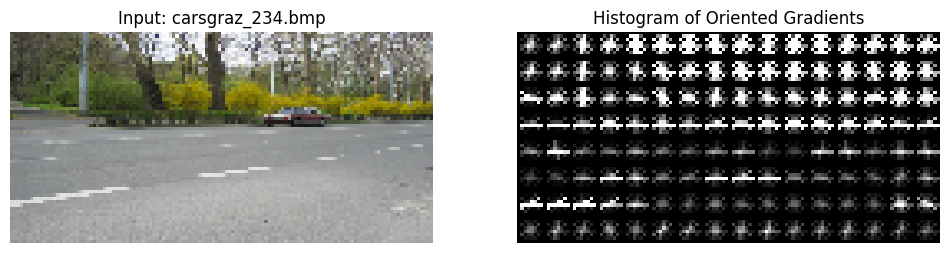

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from skimage.feature import hog
from skimage import exposure

# Folder berisi gambar dan nama output csv
folder_path = "cars"
csv_output_path = "hog_features.csv"

# Tentukan ukuran gambar yang konsisten
# Semua gambar akan di-resize ke ukuran ini sebelum ekstraksi fitur.
# Ini PENTING agar semua vektor fitur punya panjang yang sama.
TARGET_IMG_SIZE = (128, 64) 

data_for_HOG = []

# Looping untuk membaca semua gambar di dalam folder
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path)
        
        # Cek jika gambar gagal dibaca (path salah, file rusak, dll.)
        if image is None:
            print(f"Peringatan: Gagal membaca gambar {filename}. File dilewati.")
            continue

        # Resize gambar ke ukuran target
        resized_image = cv2.resize(image, TARGET_IMG_SIZE)

        # Konversi gambar ke Grayscale
        # HOG bekerja dengan gradien (perubahan intensitas), jadi paling efektif pada gambar grayscale.
        gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
        
        # Ekstraksi fitur Histogram of Oriented Gradients dari gambar grayscale
        fd, hog_image = hog(
            gray_image,
            orientations=9, # Standar umum adalah 9 orientasi
            pixels_per_cell=(8, 8), # Standar umum
            cells_per_block=(2, 2), # Standar umum
            visualize=True
            # channel_axis tidak diperlukan lagi karena sudah grayscale
        )
        
        # Menyimpan fitur HOG ke dalam list
        current_features = [filename] + fd.tolist()
        data_for_HOG.append(current_features)

        # --- Visualisasi ---
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
        
        ax1.axis('off')
        # Tampilkan gambar original yang sudah di-resize (dalam RGB)
        ax1.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
        ax1.set_title(f'Input: {filename}')

        # Tingkatkan kontras visualisasi HOG agar lebih jelas
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        
        ax2.axis('off')
        ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
        ax2.set_title('Histogram of Oriented Gradients')
        plt.show()

# Menyimpan fitur HOG ke dalam file CSV
if data_for_HOG:
    num_features = len(data_for_HOG[0]) - 1
    columns = ['filename'] + [f'feature_{i+1}' for i in range(num_features)]
    
    df = pd.DataFrame(data_for_HOG, columns=columns)
    
    df.to_csv(csv_output_path, index=False)
    print(f"Fitur HOG berhasil diekstrak dan disimpan di {csv_output_path}")
else:
    print("Tidak ada gambar yang diproses.")


# Histogram warna

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from skimage.feature import hog
from skimage import exposure

# Folder berisi gambar dan nama output csv
folder_path = "cars"
csv_output_path = "hog_features.csv"

# Tentukan ukuran gambar yang konsisten
# Semua gambar akan di-resize ke ukuran ini sebelum ekstraksi fitur.
# Ini PENTING agar semua vektor fitur punya panjang yang sama.
TARGET_IMG_SIZE = (128, 64) 

data_for_HOG = []

# Looping untuk membaca semua gambar di dalam folder
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path)
        
        # Cek jika gambar gagal dibaca (path salah, file rusak, dll.)
        if image is None:
            print(f"Peringatan: Gagal membaca gambar {filename}. File dilewati.")
            continue

        # Resize gambar ke ukuran target
        resized_image = cv2.resize(image, TARGET_IMG_SIZE)

        # Konversi gambar ke Grayscale
        # HOG bekerja dengan gradien (perubahan intensitas), jadi paling efektif pada gambar grayscale.
        gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
        
        # Ekstraksi fitur Histogram of Oriented Gradients dari gambar grayscale
        fd, hog_image = hog(
            gray_image,
            orientations=9, # Standar umum adalah 9 orientasi
            pixels_per_cell=(8, 8), # Standar umum
            cells_per_block=(2, 2), # Standar umum
            visualize=True
            # channel_axis tidak diperlukan lagi karena sudah grayscale
        )
        
        # Menyimpan fitur HOG ke dalam list
        current_features = [filename] + fd.tolist()
        data_for_HOG.append(current_features)

        # --- Visualisasi ---
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
        
        ax1.axis('off')
        # Tampilkan gambar original yang sudah di-resize (dalam RGB)
        ax1.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
        ax1.set_title(f'Input: {filename}')

        # Tingkatkan kontras visualisasi HOG agar lebih jelas
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        
        ax2.axis('off')
        ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
        ax2.set_title('Histogram of Oriented Gradients')
        plt.show()

# Menyimpan fitur HOG ke dalam file CSV
if data_for_HOG:
    num_features = len(data_for_HOG[0]) - 1
    columns = ['filename'] + [f'feature_{i+1}' for i in range(num_features)]
    
    df = pd.DataFrame(data_for_HOG, columns=columns)
    
    df.to_csv(csv_output_path, index=False)
    print(f"Fitur HOG berhasil diekstrak dan disimpan di {csv_output_path}")
else:
    print("Tidak ada gambar yang diproses.")


# Edge Density

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

# fitur membaca folder yang berisi gambar dan nama output csv
folder_path = "cars"
csv_output_path = "edge_features.csv"

data_for_EDGE = []

# fitur looping untuk membaca semua gambar di dalam folder
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)

        # Step 4: Apply Gaussian Blur to reduce noise
        blurred_image = cv2.GaussianBlur(image, (5, 5), 1.4)

        # Step 5: Apply Canny edge detector
        edges = cv2.Canny(blurred_image, 50, 150)

        fa = np.concatenate((edges), axis=0)
        current_features = [filename] + fa.tolist()
        data_for_EDGE.append(current_features)

        # Step 6: Display the original image and the edge-detected image
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title('Original Image')
        plt.imshow(image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title('Edge Detected Image')
        plt.imshow(edges, cmap='gray')
        plt.axis('off')

        plt.show()

if data_for_EDGE:
    num_features = len(data_for_EDGE[0]) - 1 
    columns = ['filename'] + [f'feature_{i+1}' for i in range(num_features)]
    
    df = pd.DataFrame(data_for_EDGE, columns=columns)
    
    df.to_csv(csv_output_path, index=False)